Компьютерное зрение - область науки, связанная с анализом зрительной информации.  
Информация - данные, на основе которых возможно принятие решений  

Некоторые задачи компьютерного зрения:  
- Классификация изображений
- Детектирование объектов на изображениях
- Сегментация объектов  
- Трекинг объекта
- Выделение ключевых точек на изображении
- Извлечение глубины по двумерному кадру (последовательности кадров)
- Построение 3д модели 
- Генерация изображений с заданной семантикой
- Идентификация объекта по изображению
- Аутентификация объекта по изображению

# Классификация

https://paperswithcode.com/task/image-classification

##### Задача: Построить в пространстве признаков разделяющую поверхность так, чтобы объекты разных классов попадали по разные стороны от нее.

#### Метрики качества:
- Accuracy - доля правильных ответов алгоритма
- Precision (точность) - доля правильных предсказаний, среди объектов относенных алгоритмом к определенному классу
- Recall (полнота) - доля правильных предсказаний среди всех имеющихся примеров определенного класса
- F1-score - среднее гармоническое между точностью и полнотой  
- ROC AUC
- AUC PR  
f1=2 * (precision * recall) / (precision + recall)

#### Функции потерь:
- CrossEngropyLoss

#### Как получить predict

In [1]:
import torch
import torchvision

class Classifier(torch.nn.Module):
    def __init__(self, num_classses):
        self.encoder = torchvision.models.mobilenet_v2()
        self.pooling = torch.nn.AdaptiveAvgPool2d()
        self.linear_classifier = torch.nn.Linear(self.encoder.last_channel, num_classes)
        
    def forward(self, sample):
        final_feature_map = encoder.features(sample)
        pooled_features = nn.functional.adaptive_avg_pool2d(final_feature_map, (1, 1))
        flatten_features = torch.flatten(pooled_features, 1)
        logits = self.linear_classifier(flatten_features_features) # argmax(logits) = pred_class
        return logits

# Детекция объектов

##### Задача: Ограничить каждый объект прямоугольной рамкой, указать класс этого объекта

#### Метрики качества:
- IoU
- mAP
- mAR
- Precision
- Recall

# Intersection over union (IoU) and Mean Average Precision (mAP)

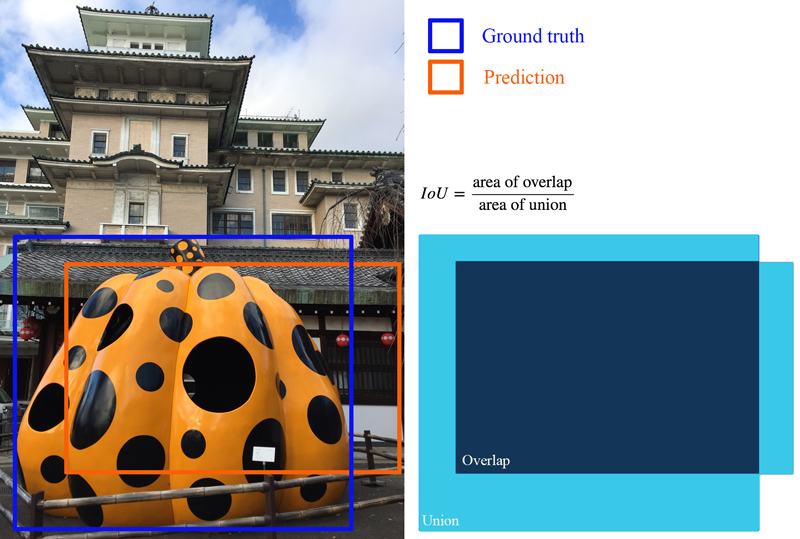

In [ ]:
def IOU(true_box, pred_box):
    # determining the minimum and maximum -coordinates of the intersection rectangle
    xmin_inter = max(true_box.xmin, pred_box.xmin)
    ymin_inter = max(true_box.ymin, pred_box.ymin)
    xmax_inter = min(true_box.xmax, pred_box.xmax)
    ymax_inter = min(true_box.ymax, pred_box.ymax)
 
    # calculate area of intersection rectangle
    inter_area = max(0, xmax_inter - xmin_inter + 1) * max(0, ymax_inter - ymin_inter + 1)
 
    # calculate area of actual and predicted boxes
    actual_area = (true_box.xmax - true_box.xmin + 1) * (true_box.ymax - true_box.ymin + 1)
    pred_area = (pred_box.xmax - pred_box.xmin + 1) * (pred_box.ymax - pred_box.ymin + 1)
 
    # computing intersection over union
    iou = inter_area / float(actual_area + pred_area - inter_area)
 
    # return the intersection over union value
    return iou

### mAP

Считаем, что для каждого true_box выбран pred_box, который имеет с ним максимальный IoU. Также true_boxes и pred_boxes упорядочены по confidence.

AP - площадь под PR кривой
mAP - усредненный AP по всем классам
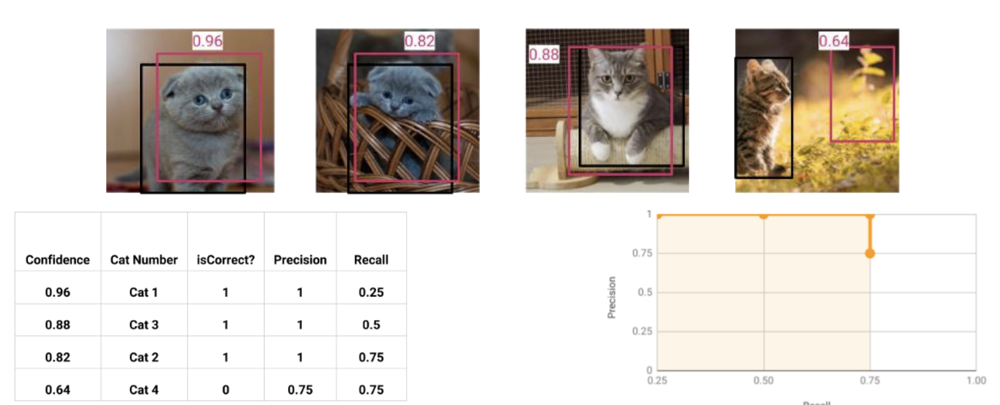

In [ ]:
import numpy as np
import pandas as pd

def mAP(true_boxes, true_classes, pred_boxes, pred_classes):
    fn = np.sum(true_classes != pred_classes)
    
    precisions = []
    recalls = []
    
    tp = fp = 0
    
    for true_box, pred_box in zip(true_boxes, pred_boxes):
        iou = IOU(true_box, pred_box)
        if iou > 0.5:
            tp += 1
        else:
            fp += 1
            
        precision = tp / (tp + fp)
        recall = tp / (tp + fn)
        
        precisions.append(precision)
        recalls.append(recall)
    
    df = pd.DataFrame()
    df['precision'] = precisions
    df['recall'] = recalls
    
    interpolated_precisions = df.groupby('recall')['precision'].transform('max')
    
    prec_at_rec = []
    for recall_level in np.linspace(0.0, 1.0, 101):
        try:
            x = eval_table[eval_table['Recall'] >= recall_level]['Precision']
            prec = max(x)
        except:
            prec = 0.0
        prec_at_rec.append(prec)
        
    return np.mean(prec_at_rec)

https://jonathan-hui.medium.com/map-mean-average-precision-for-object-detection-45c121a31173

### NMS

1. Упорядочиваем боксы по уверенности
2. Идем от максимального, во внутреннем цикле пробегаемся по остальным боксам  
    Если пересечение боксов больше порога - убираем бокс с меньшей уверенностью
    
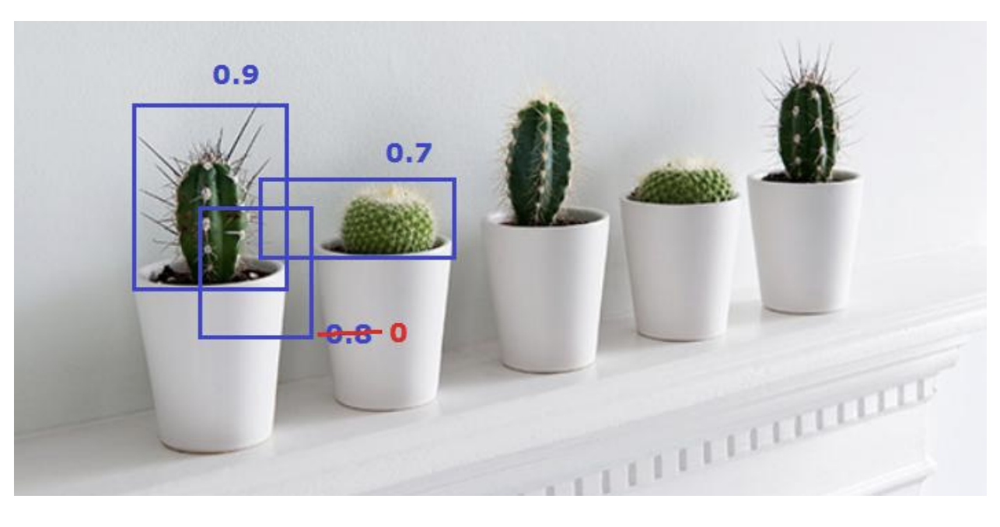

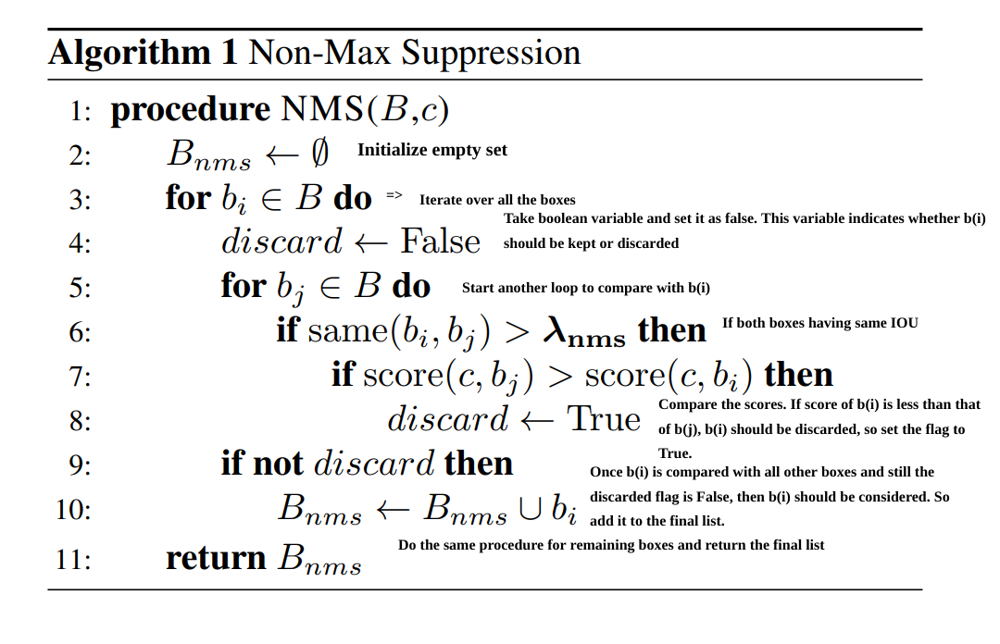

Помимо порога уверенности в определении класса появляется IoU порог в качестве гиперпараметра для оценки алгоритма

#### Функции потерь:
- CrossEngropyLoss
- L1Loss

#### Как получить predict

In [1]:
import torch
import torchvision

class Classifier(torch.nn.Module):
    def __init__(self, num_classses):
        self.encoder = torchvision.models.mobilenet_v2()
        self.cls = torch.nn.Conv2d(
            self.encoder.last_channel,
            self.num_anchors * num_classes,
            3,
            padding=1,
        )
        self.reg = torch.nn.Conv2d(
            self.encoder.last_channel,
            self.num_anchors * 4, # 4 numbers to encode bbox
            3,
            padding=1,
        )
        
    def forward(self, sample):
        final_feature_map = encoder.features(sample)
        bbox_preds = self.reg(final_feature_map)
        cls_scores = self.cls(final_feature_map)
        return bbox_preds, cls_scores

# Архитектуры

# RCNN

* Генерируем регионы интереса(около 2000)
* Делаем ресайз каждого региона и прогоняем через сетку;
* Предсказываем класс и уточняем регионы с помощью регрессии;
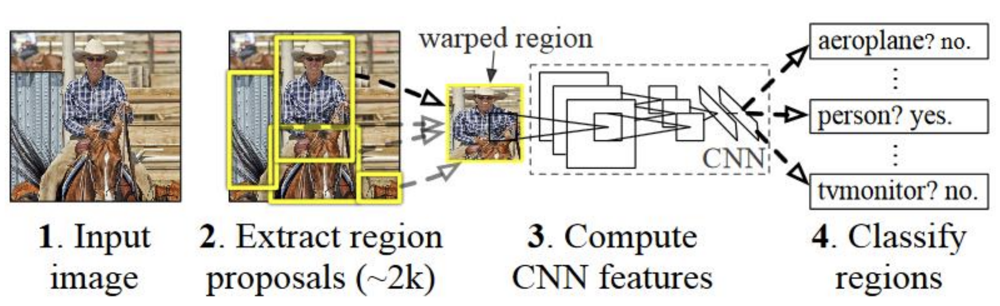

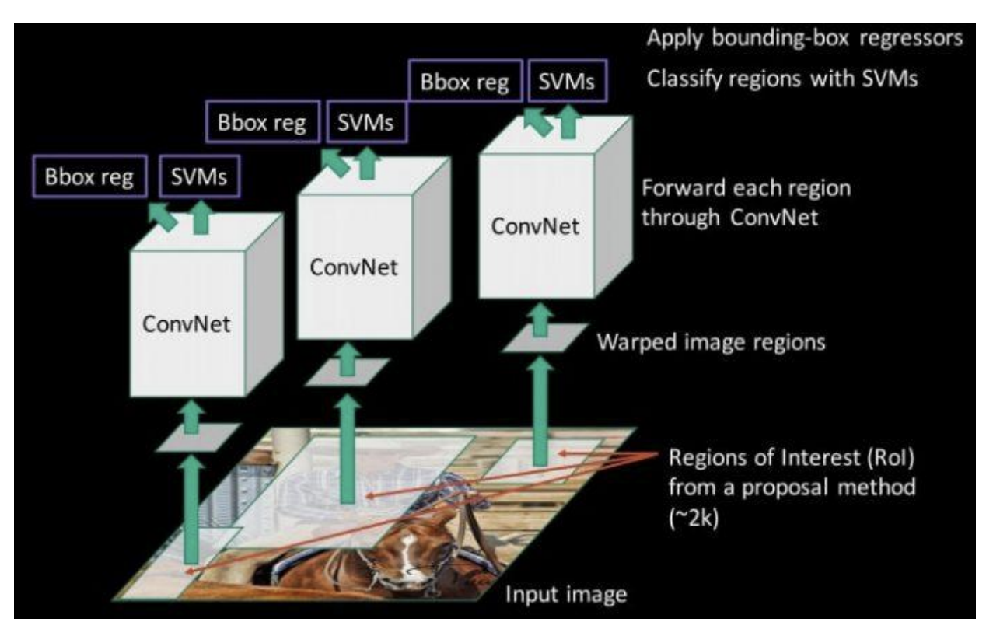

Минусы: Долго

# Fast-RCNN

Чтобы ускорить давайте прогоним изображение черенз сетку один раз, но тогда вопрос про разные размеры регионов.  
* пропускаем через CNN-сеть изображение целиком
* регионы накладываются на полученную карту признаков
* признаки из разных регионов приводятся в одну размерность с помощью RolPooling

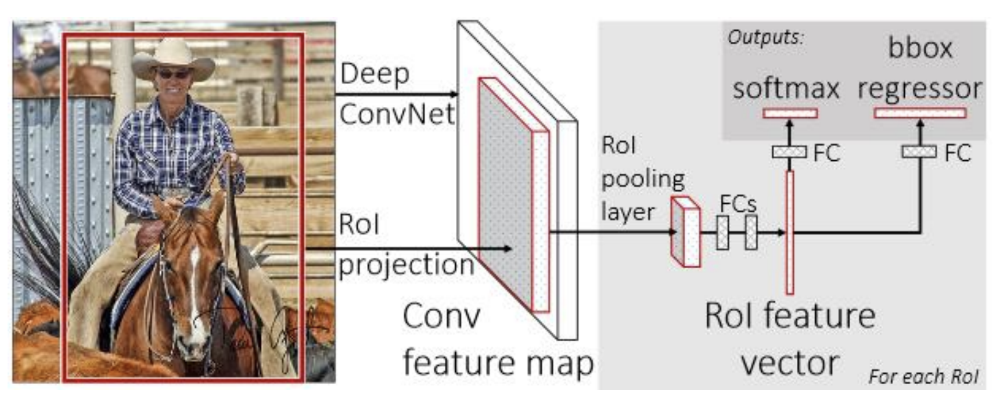

### The Spatial Pyramid Pooling Layer

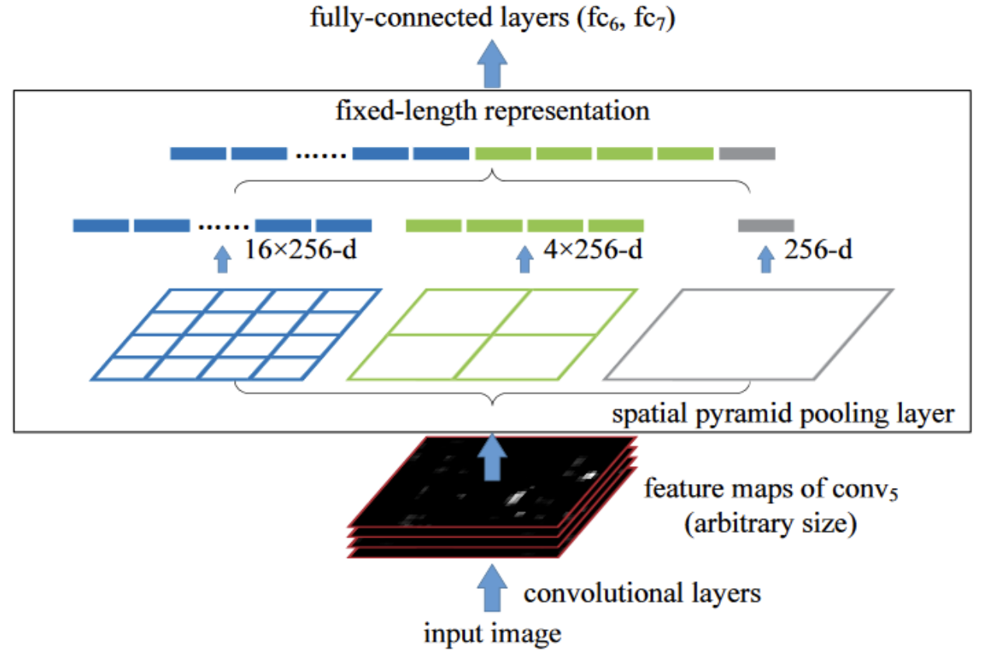

### RoiPooling
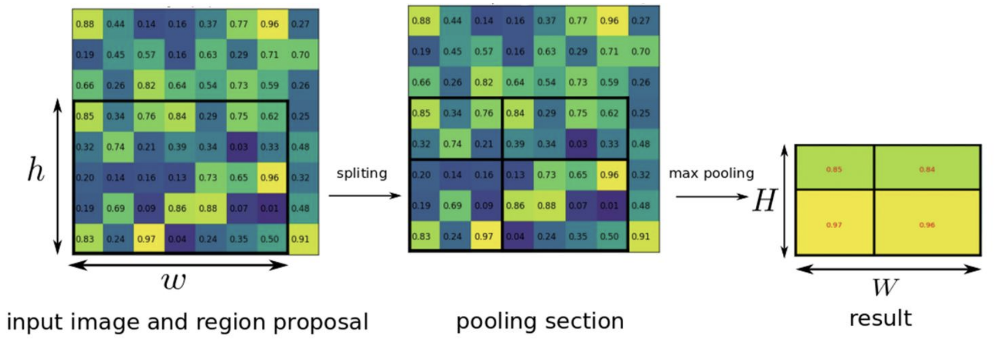

# Faster R-CNN

Регионы теперь генерирует дополнительная сетка

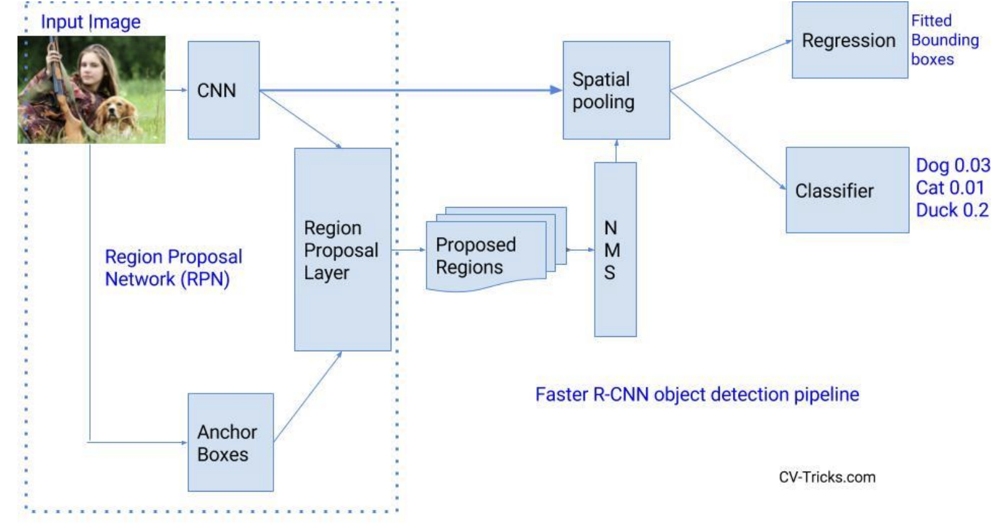

# Region proposal network(RPN)
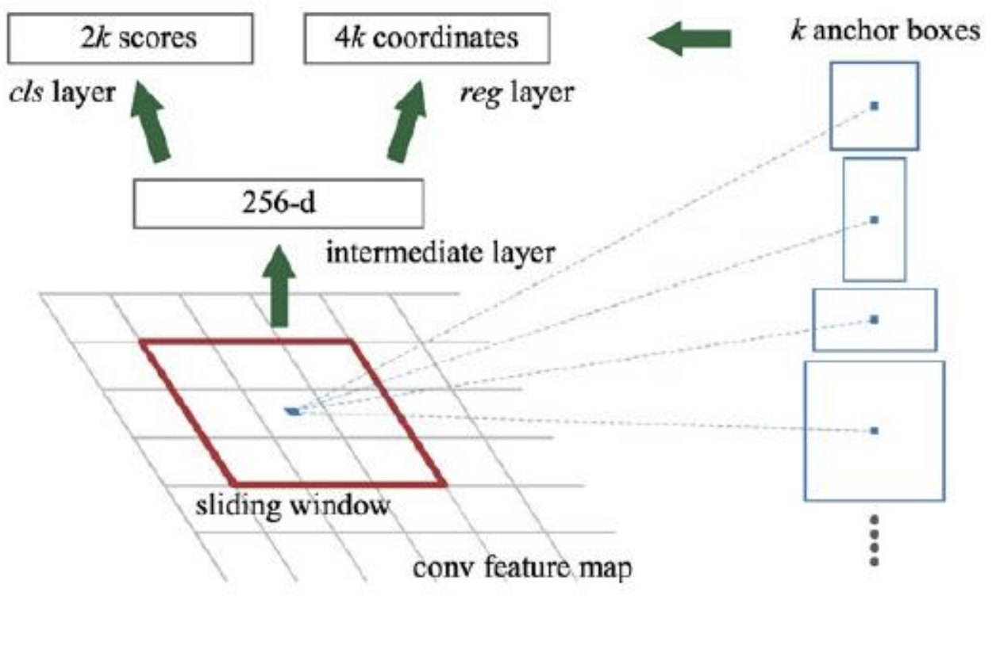

### SSD

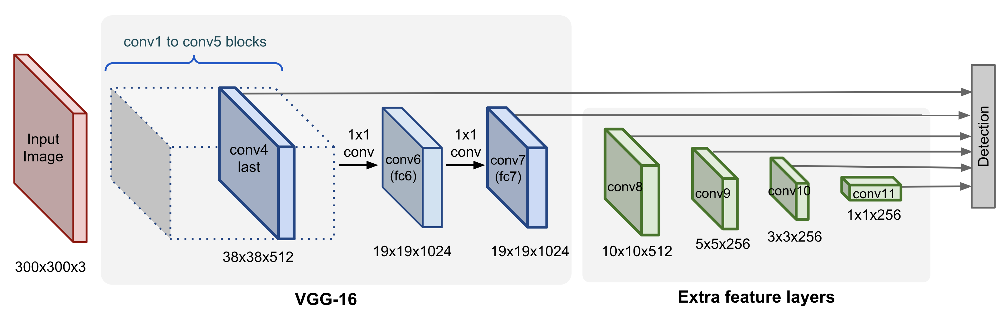

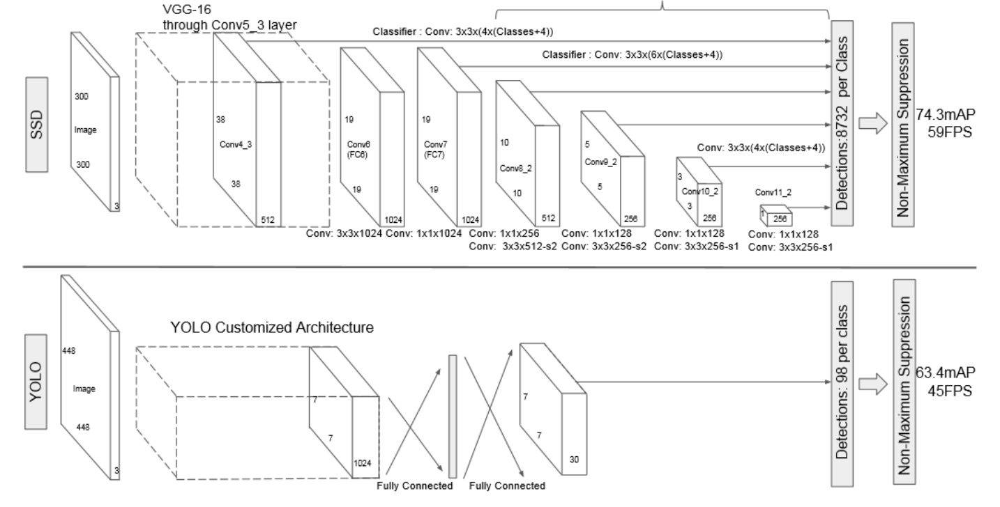

### Anchors

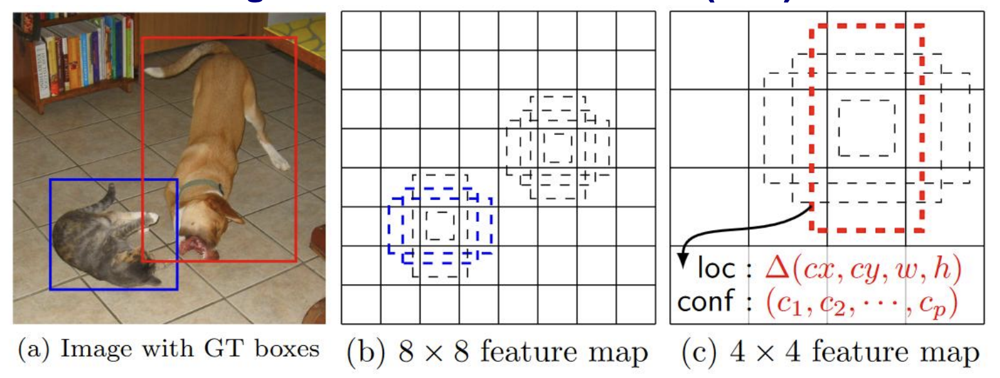

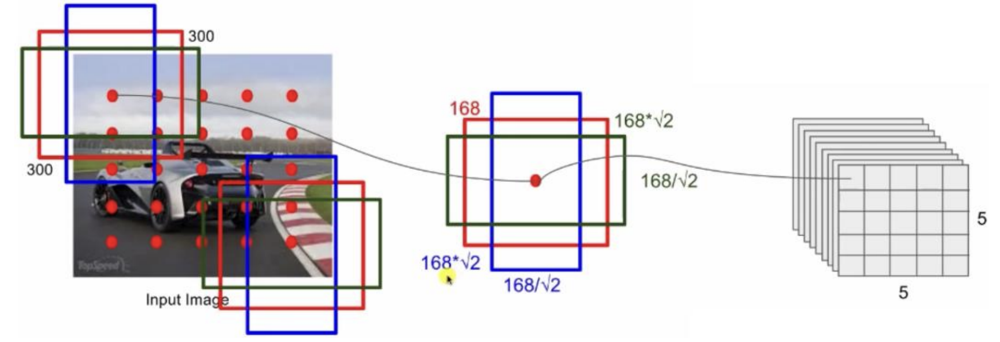

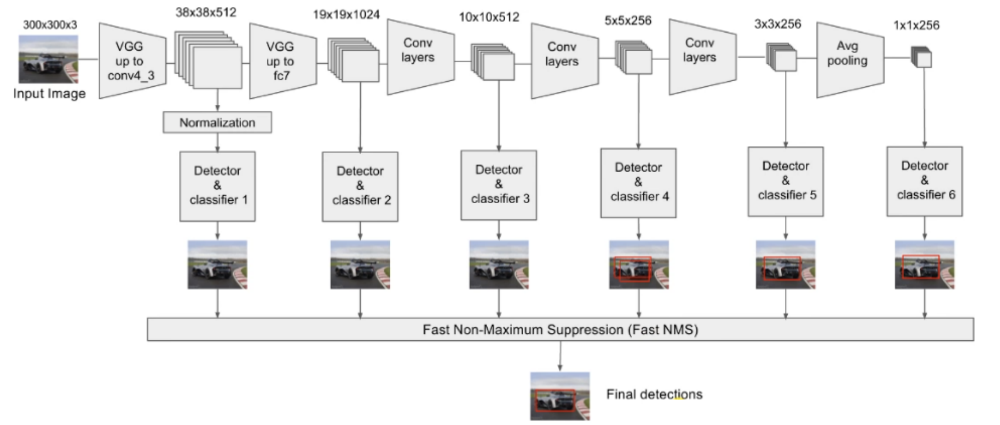

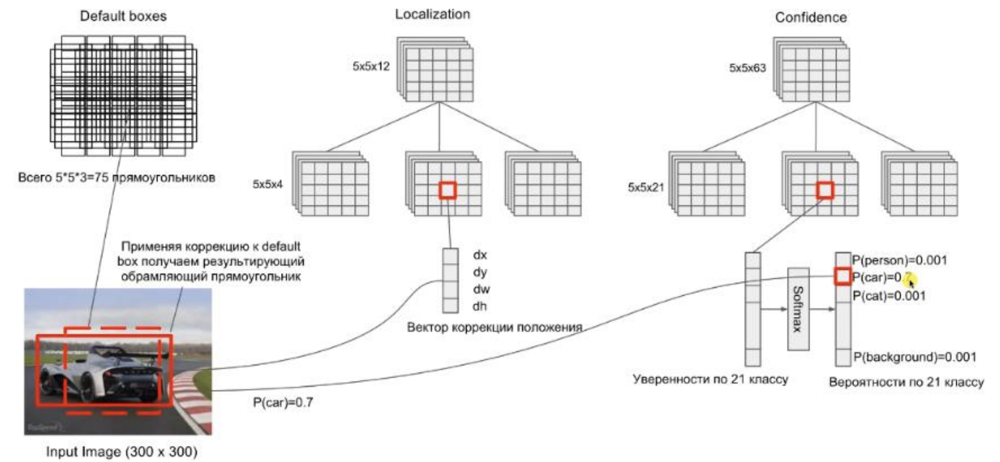

размеры выхода: 5x5 (сетка) x #якорей (default boxes) x (# классов + 1)
5x5 (сетка) x #якорей (default boxes) x 4 (регрессия для регионов)
* очень быстро с хорошим качеством
* детектирование на разных масштабах
* большое число default boxes на разных масштабах

### Yolo

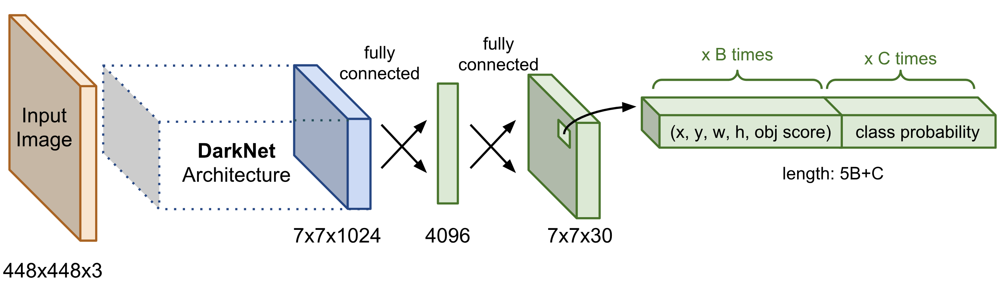

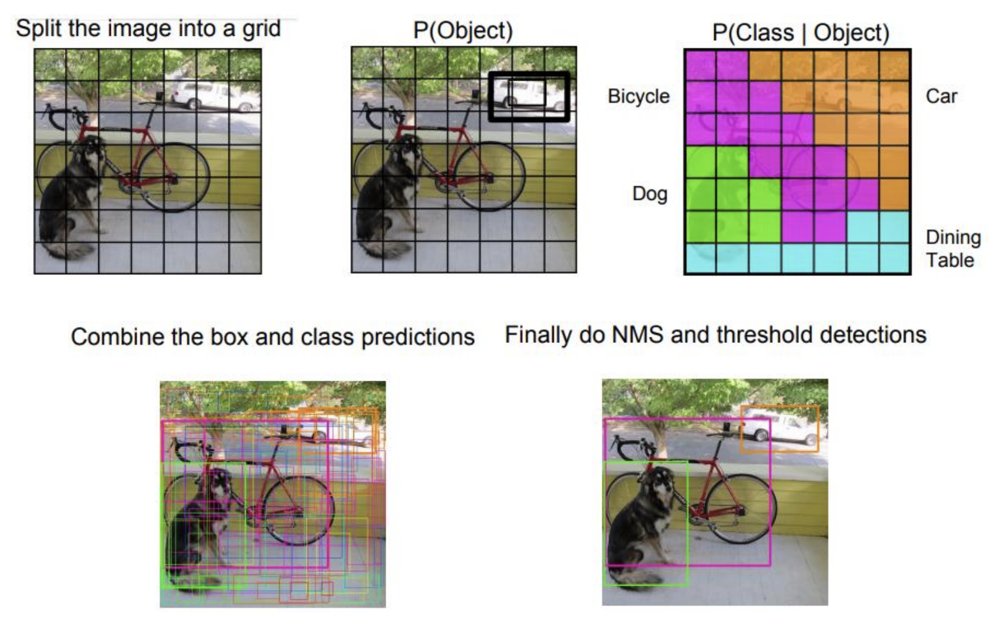

# Семантическая сегментация

Бывает еще instance сегментация - тогда выделяются конкретные объекты, c указанием класса

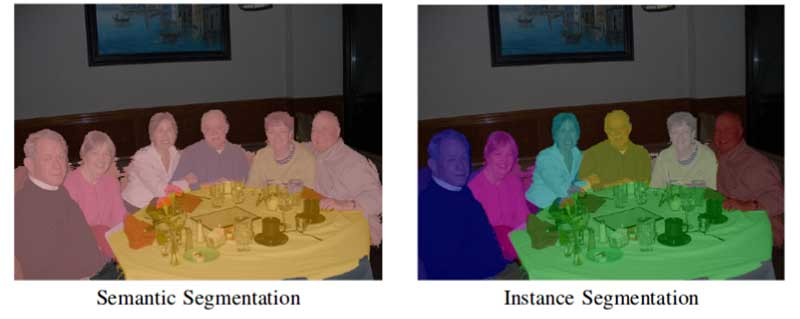

##### Задача: для каждого пикселя указать принадлежность его к некоторому классу (или объекту)

#### Метрики качества:
- Попиксельные accuracy, precision, recall, AUC_PR, ROC_AUC
- IoU
- mAP
- mAR

Как применяется IoU в задаче сегментации?

#### Функции потерь:
- CrossEngropyLoss
- SoftDiceLoss

In [ ]:
def soft_dice_loss(y_true, y_pred, epsilon=1e-6): 
    ''' 
    Soft dice loss calculation for arbitrary batch size, number of classes, and number of spatial dimensions.
    Assumes the `channels_last` format.
  
    # Arguments
        y_true: b x X x Y( x Z...) x c One hot encoding of ground truth
        y_pred: b x X x Y( x Z...) x c Network output, must sum to 1 over c channel (such as after softmax) 
        epsilon: Used for numerical stability to avoid divide by zero errors
    
    # References
        More details on Dice loss formulation 
        https://mediatum.ub.tum.de/doc/1395260/1395260.pdf (page 72)
    '''
    
    # skip the batch and class axis for calculating Dice score
    axes = tuple(range(1, len(y_pred.shape)-1)) 
    numerator = 2. * np.sum(y_pred * y_true, axes)
    denominator = np.sum(np.square(y_pred) + np.square(y_true), axes)
    
    return 1 - np.mean((numerator + epsilon) / (denominator + epsilon)) # average over classes and batch

#### Как получить predict

In [3]:
import torch
import torchvision

class SegmentationModel(torch.nn.Module):
    def __init__(self, num_classses):
        self.encoder = torchvision.models.mobilenet_v2()
        self.segm_conv = torch.nn.Conv2d(self.encoder.last_channel, num_classes)
        
    def forward(self, sample):
        final_feature_map = encoder.features(sample)
        logits = self.segm_conv(final_feature_map) # argmax(logits) = pred_class
        return logits

# Подбираем метрику под бизнес-задачу

1. Классификация товаров в магазине по фото. Бизнес кейс - отслеживать по камерам каких товаров не достаточно на полке и вовремя выкладывать товар. (Как измерить эффективность решения задачи с точки зрения бизнеса?)
- Как выглядит распределение (количество примеров для разных классов)?
- Сколько примерно классов?
- Ошибки первого(false positive) или второго (false negative) рода являются наиболее критичными?
- Какой метрикой воспользовались бы для оценки качества модели?
2. Детекция пешеходов. Бизнес кейс - считать проходимость локаций в городе, чтобы оценивать привлекательность локаций для показа рекламы / открытия торговых точек. (бизнес метрика?)
- Какие могут возникнуть технические проблемы? Какие вопросы стоит задать заказчику и какие требования выдвинуть к оборудованию?
- Ошибки первого/второго рода важнее?
- Какую метрику использовать? (что с гиперпараметрами метрики)
3. Сегментация моркови: Бизнес кейс - https://www.youtube.com/watch?v=rvoKeZHieNU.
- Какие технические требования к системе? Как они трансформирутются в требования к модели?
- Какие ошибки важнее?
- Multiclass или Inctance сегментация?
- Какую метрику использовать?